# 🌱 House Plant Species Classification 🍀 | VGG16

This notebook builds and evaluates a deep learning model to classify images of house plant species using transfer learning with a pre-trained VGG16 model. The approach includes data preprocessing, model architecture setup, training, and visualization of results, making it suitable for classifying multiple plant species.

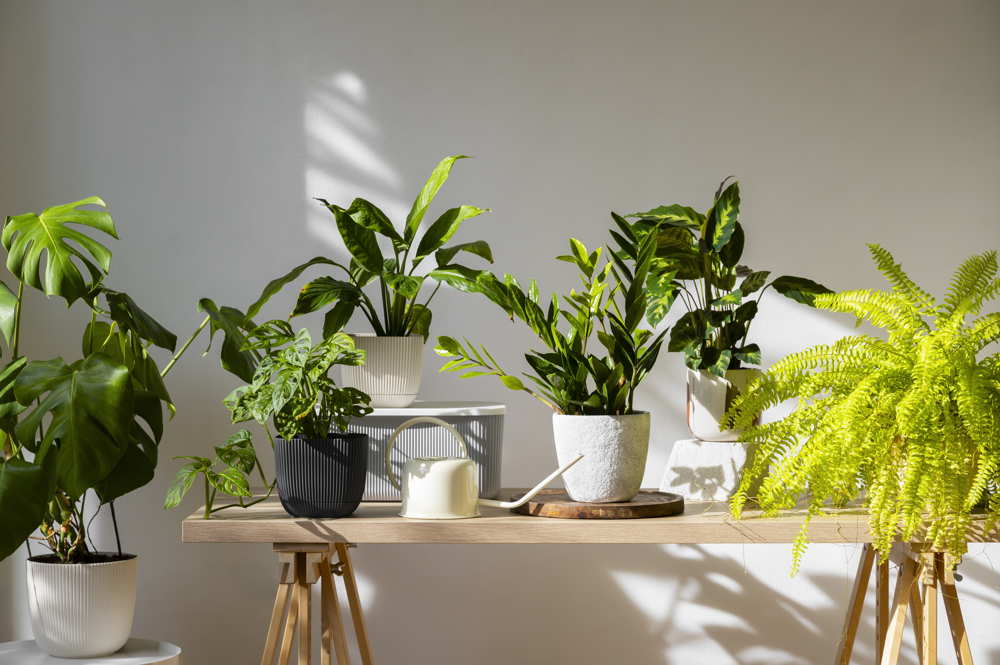

### Steps in this Notebook 📝
#### 1. Import Libraries 📚
#### 2. Data Preparation 🧹
#### 3. Model Architecture 📐
#### 4. Model Compilation and Training 🤸
#### 5. Performance Visualization 📑
#### 6. Prediction and Visualization 📊

## 1. Importing Libraries 📚
Essential libraries and modules are imported, including TensorFlow, Keras, and sklearn for model building and evaluation and Matplotlib for data visualization.

In [ ]:
# Essential libraries for data manipulation, visualization, and model building
import re
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Scikit-Learn utilities for handling class imbalance and generating evaluation reports
from sklearn.utils import class_weight
from sklearn.metrics import classification_report

# Keras modules for neural network layers, model building, and training optimization
from tensorflow.keras import layers, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-trained VGG16 model for transfer learning
from tensorflow.keras.applications import VGG16

## 2. Data Preparation 🧹
The dataset of plant images is loaded using ImageDataGenerator with a training and validation split.
Data Augmentation: Techniques like rescaling, rotation, shifting, and flipping are applied to increase data variability and improve model generalization.

In [2]:
# Path to the dataset and essential parameters for data processing and model input
dataset_path = "/kaggle/input/house-plant-species/house_plant_species"
batch_size = 32
img_height, img_width = 224, 224  # Target image dimensions for model input

# Data generator with augmentation for training and validation split
datagen = ImageDataGenerator(
    rescale=1./255,                 # Normalizes pixel values to range [0, 1]
    validation_split=0.2,           # Reserves 20% of data for validation
    rotation_range=0.2,             # Randomly rotates images by 20 degrees
    width_shift_range=0.2,          # Shifts images horizontally by 20%
    height_shift_range=0.2,         # Shifts images vertically by 20%
    zoom_range=0.2,                 # Randomly zooms images by 20%
    horizontal_flip=True           # Randomly flips images horizontally
)

In [3]:
# Generating training dataset with data augmentation
train_ds = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),  # Resizes images to the specified dimensions
    batch_size=batch_size,
    class_mode='categorical',             # Multi-class classification mode
    subset='training'                     # Uses 80% of data for training
)

# Generating validation dataset with data augmentation
val_ds = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',                   # Uses 20% of data for validation
)

Found 11715 images belonging to 47 classes.
Found 2905 images belonging to 47 classes.


## 3. Model Architecture 📐
Transfer Learning with VGG16: A VGG16 base model pre-trained on the ImageNet dataset is used, with additional convolutional and fully connected layers added on top for fine-tuning.
Class Weights: To handle class imbalance, class weights are calculated and applied during model training to ensure balanced learning across all classes.

In [4]:
# Loading the pre-trained VGG16 model without its top layer and freezing its layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
base_model.trainable = False  # Freezes all layers to retain pre-trained features

# Unfreezing the last 4 layers for fine-tuning
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Defining the number of classes in the dataset
num_classes = 47

# Building the model architecture using the base model and additional custom layers
model = Sequential([
    layers.Input(shape=(img_height, img_width, 3)),  # Input layer with defined shape
    base_model, # Pre-trained VGG16 as the feature extractor
    layers.Flatten(), # Flattens output before the dense layer
    layers.Dense(512, activation='relu'),  
    layers.BatchNormalization(),               
    layers.Dropout(0.5),                          
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),              
    layers.Dense(num_classes, activation='softmax') # Output layer for multi-class classification
])

In [5]:
# Calculating class weights to handle class imbalance
class_weights = class_weight.compute_class_weight(
    class_weight='balanced',           # Balances weights inversely proportional to class frequencies
    classes=np.unique(train_ds.classes),  # Unique class labels in the training data
    y=train_ds.classes                   # Class labels in the training data
)

# Converting the class weights array to a dictionary format for model training
class_weights = dict(enumerate(class_weights))

## 4. Model Compilation and Training 🤸
The model is compiled with the Adam optimizer and categorical cross-entropy loss.
Callbacks: EarlyStopping and ModelCheckpoint callbacks are implemented to prevent overfitting and save the best model.
The model is trained with both training and validation datasets, and class weights are applied to address imbalanced classes.

In [6]:
# Compiling the model with specified optimizer, loss function, and evaluation metric
model.compile(
    optimizer=Adam(learning_rate=1e-4),         # Adam optimizer with a low learning rate for stable training
    loss='categorical_crossentropy',            # Suitable loss for multi-class classification
    metrics=['accuracy']                        # Accuracy metric to monitor performance
)

# Displaying the model architecture and parameter details
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 47)             │         6,063 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,734,127 (105.80 MB)

 Trainable params: 20,097,071 (76.66 MB)

 Non-trainable params: 7,637,056 (29.13 MB)

In [7]:
# Early stopping to prevent overfitting by monitoring validation loss
early_stopping = EarlyStopping(
    monitor='val_loss',               # Monitors validation loss for improvements
    patience=7,                      # Stops training if no improvement for 7 epochs
    restore_best_weights=True         # Restores model to the best weights observed
)

# Model checkpointing to save the best model based on validation loss
model_checkpoint = ModelCheckpoint(
    'best_model.keras',               # Filepath for saving the best model
    save_best_only=True,              # Saves model only if validation loss improves
    monitor='val_loss'                # Monitors validation loss for saving criteria
)

In [8]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=40,
    class_weight=class_weights,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/40


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730807926.372523     638 service.cc:145] XLA service 0x78f3700061b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730807926.372581     638 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1730807926.372586     638 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/367 ━━━━━━━━━━━━━━━━━━━━ 3:34:39 35s/step - accuracy: 0.0000e+00 - loss: 6.0982

I0000 00:00:1730807948.380449     638 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  2/367 ━━━━━━━━━━━━━━━━━━━━ 1:02 170ms/step - accuracy: 0.0156 - loss: 5.8367     

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


367/367 ━━━━━━━━━━━━━━━━━━━━ 555s 1s/step - accuracy: 0.0288 - loss: 4.9024 - val_accuracy: 0.0778 - val_loss: 4.2210
Epoch 2/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 501s 1s/step - accuracy: 0.0677 - loss: 4.1479 - val_accuracy: 0.1948 - val_loss: 3.1290
Epoch 3/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 483s 1s/step - accuracy: 0.1059 - loss: 3.6965 - val_accuracy: 0.2131 - val_loss: 2.9500
Epoch 4/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 482s 1s/step - accuracy: 0.1668 - loss: 3.2425 - val_accuracy: 0.1098 - val_loss: 3.8271
Epoch 5/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 485s 1s/step - accuracy: 0.1848 - loss: 3.1264 - val_accuracy: 0.4134 - val_loss: 2.1795
Epoch 6/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 483s 1s/step - accuracy: 0.2676 - loss: 2.7148 - val_accuracy: 0.4492 - val_loss: 2.0582
Epoch 7/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 478s 1s/step - accuracy: 0.3144 - loss: 2.4313 - val_accuracy: 0.4954 - val_loss: 1.9102
Epoch 8/40
367/367 ━━━━━━━━━━━━━━━━━━━━ 481s 1s/step - accuracy: 0.3683 - loss: 2.2292 - val_accuracy: 0.494

## 5. Performance Visualization 📑
Loss and Accuracy Curves: Training and validation loss and accuracy are plotted to assess model performance over epochs.

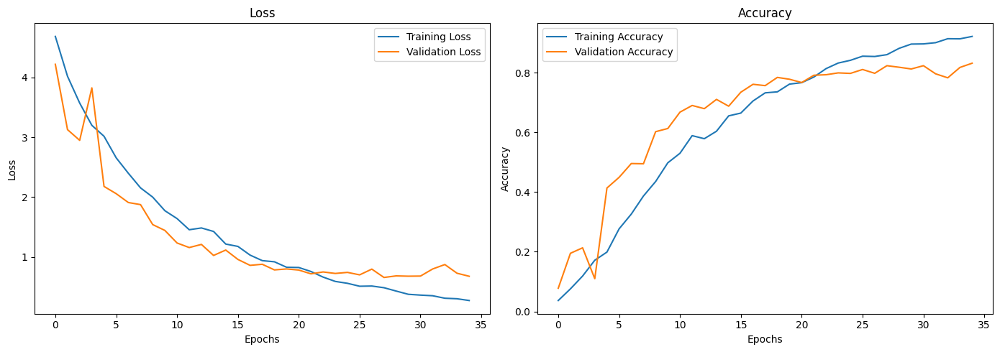

In [9]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(14, 5))

# Training and validation loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## 6. Prediction and Visualization 📊

After training, predictions are made on a sample batch of validation images.

### Label Extraction and Display
Predictions and actual labels are displayed as categorical strings, using regex to trim labels and show only the relevant portions. A grid of images is displayed, showcasing actual and predicted labels for visual evaluation.

### Classification Report
To assess the model's performance quantitatively, a classification report is generated. This report includes metrics such as precision, recall, F1-score, and support for each class, giving insights into how well the model performs across different categories. The classification report is displayed after obtaining the true labels and predicted labels, allowing us to evaluate the accuracy and effectiveness of the model in classifying each class.


In [10]:
labels = train_ds.class_indices  # This retrieves the mapping of labels
labels = dict((v, k) for k, v in labels.items())  # Reverse mapping for index-to-label

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


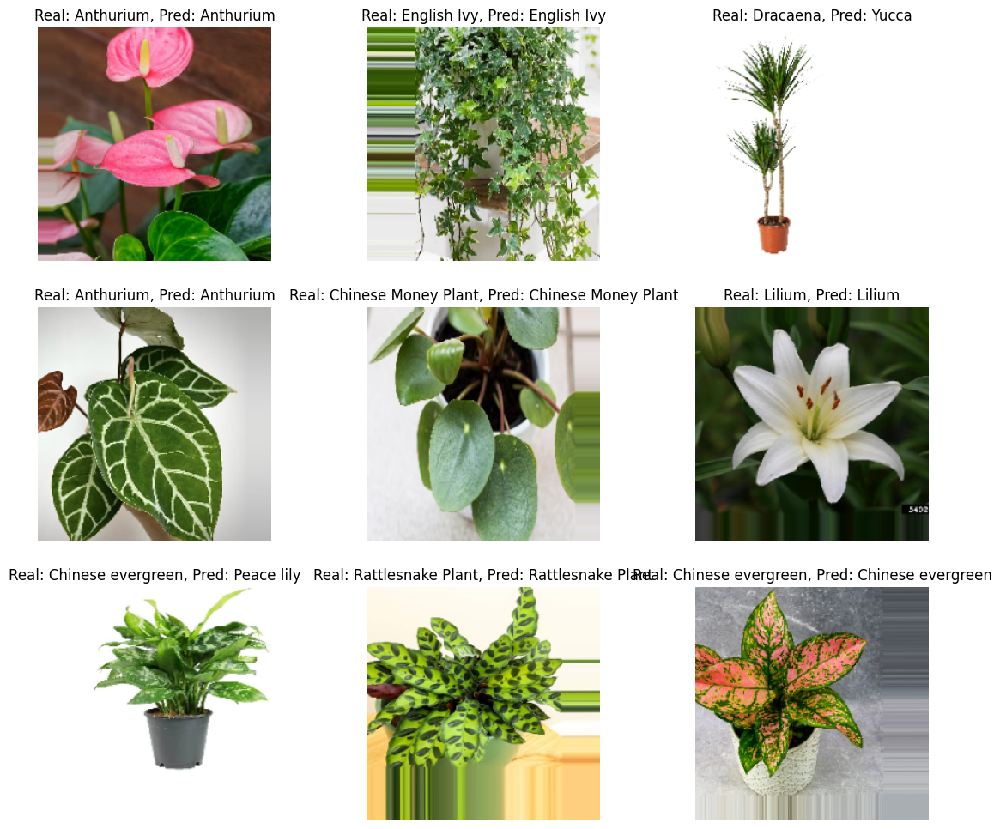

In [15]:
# Limit to 9 images from validation set
sample_images, sample_labels = next(iter(val_ds))
sample_images, sample_labels = sample_images[:9], sample_labels[:9]

# Make predictions on the 9 sample images
predictions = model.predict(sample_images)
predicted_labels = np.argmax(predictions, axis=1)  # Predicted class indices
actual_labels = np.argmax(sample_labels, axis=1)    # Actual class indices

# Map indices to class names
predicted_labels_str = [labels[i] for i in predicted_labels]
actual_labels_str = [labels[i] for i in actual_labels]

# Pattern for cleaning up label names
pattern = r"^(.*?)(?=\s*\(.*\))"

# Display sample predictions with actual and predicted labels and accuracy
plt.figure(figsize=(14, 12))
for i in range(9):
    # Cleaning up labels for display
    actual_match = re.search(pattern, actual_labels_str[i])
    predicted_match = re.search(pattern, predicted_labels_str[i])
    actual_label_short = actual_match.group(1) if actual_match else actual_labels_str[i]
    predicted_label_short = predicted_match.group(1) if predicted_match else predicted_labels_str[i]
    
    plt.subplot(3, 3, i + 1)
    plt.imshow((sample_images[i] * 255).astype("uint8"))  # Rescales image to 0-255
    plt.title(f"Real: {actual_label_short}, Pred: {predicted_label_short}")
    plt.axis("off")

plt.show()

In [12]:
# Evaluation
model.evaluate(val_ds)

91/91 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.8235 - loss: 0.6692


[0.6835566163063049, 0.8134251236915588]

In [13]:
test_ds = datagen.flow_from_directory(
    dataset_path,
    target_size=(img_height, img_width),
    batch_size=1,  # Set batch size to 1 temporarily
    class_mode='categorical',
    subset='validation',
    shuffle=False  # Ensure the order remains consistent
)

# Generate predictions
test_ds.reset()  # Reset generator
pred_class_indices = np.argmax(model.predict(test_ds), axis=1)  # Predict class indices

# Retrieve true labels
true_class_indices = test_ds.classes  # Ground truth class indices in the correct order


# Generate classification report
print(classification_report(true_class_indices, pred_class_indices, target_names=labels.values()))

Found 2905 images belonging to 47 classes.
2905/2905 ━━━━━━━━━━━━━━━━━━━━ 103s 35ms/step
                                            precision    recall  f1-score   support

     African Violet (Saintpaulia ionantha)       0.97      0.94      0.95        67
                                 Aloe Vera       0.80      0.73      0.77        49
          Anthurium (Anthurium andraeanum)       0.87      0.81      0.84        90
             Areca Palm (Dypsis lutescens)       0.97      0.86      0.91        37
       Asparagus Fern (Asparagus setaceus)       0.89      0.97      0.93        33
                    Begonia (Begonia spp.)       0.60      0.76      0.67        45
     Bird of Paradise (Strelitzia reginae)       0.82      0.91      0.86        35
         Birds Nest Fern (Asplenium nidus)       0.94      0.77      0.85        57
        Boston Fern (Nephrolepis exaltata)       0.80      0.97      0.88        59
                                  Calathea       0.71      0.54      0

# Key Learnings and Observations 🔑
Transfer learning with VGG16 helps leverage pre-trained knowledge for improved performance on custom datasets.
Addressing class imbalance with class_weight improves the model’s ability to handle underrepresented classes.
Data augmentation and callback usage contribute to better generalization and prevention of overfitting.